In [1]:
from warnings import filterwarnings
import matplotlib.pyplot as plt
import numpy as np 
import pandas as pd
from PIL import Image
from nltk.corpus import stopwords
from nltk.sentiment import SentimentIntensityAnalyzer
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score, GridSearchCV, cross_validate
from sklearn.preprocessing import LabelEncoder
from textblob import Word, TextBlob
from wordcloud import WordCloud

filterwarnings("ignore")
pd.set_option("display.max_columns",None)
pd.set_option("display.width",200)
pd.set_option("display.float_format",lambda x:"%.2f" % x)

C:\Users\Ertuğrul\AppData\Roaming\Python\Python310\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [6]:
df=pd.read_csv("nlp/datasets/wiki_data.csv",index_col=0)
df=df[:2000]

print(df.head())
df.shape

                                                text
1  Anovo\n\nAnovo (formerly A Novo) is a computer...
2  Battery indicator\n\nA battery indicator (also...
3  Bob Pease\n\nRobert Allen Pease (August 22, 19...
4  CAVNET\n\nCAVNET was a secure military forum w...
5  CLidar\n\nThe CLidar is a scientific instrumen...


(2000, 1)

In [11]:
def clean_text(text):
    text=text.str.lower()
    text=text.str.replace("[^\w\s]"," ",regex=True)
    text=text.str.replace("\n"," ")    
    text=text.str.replace("[\d]"," ")

    return text


In [12]:
df["text"]=clean_text(df["text"])

df.head()

,text
1,anovo anovo formerly a novo is a computer s...
2,battery indicator a battery indicator also k...
3,bob pease robert allen pease august 22 1940...
4,cavnet cavnet was a secure military forum whi...
5,clidar the clidar is a scientific instrument ...


In [16]:
from nltk.corpus import stopwords

def remove_stopwords(text):
    sw=stopwords.words("English")
    text=text.apply(lambda x: " ".join(x for x in str(x).split() if x not in sw))
    return text

df["text"]=remove_stopwords(df["text"])


In [17]:
pd.Series(" ".join(df["text"]).split()).value_counts()[-1000:]

fliegergruppe    1
ffâ              1
giroux           1
fertig           1
reappeared       1
                ..
discretely       1
angeo            1
ballroom         1
phã              1
formula_124      1
Name: count, Length: 1000, dtype: int64

In [18]:
remove=pd.Series(" ".join(df["text"]).split()).value_counts()[-1000:]
df["text"]=df["text"].apply(lambda x: " ".join(x for x in x.split() if x not in remove ))


In [19]:
from textblob import TextBlob
df["text"].apply(lambda x: TextBlob(x).words).head()

1    [anovo, anovo, formerly, novo, computer, servi...
2    [battery, indicator, battery, indicator, also,...
3    [bob, pease, robert, allen, pease, august, 22,...
4    [cavnet, cavnet, secure, military, forum, beca...
5    [clidar, clidar, scientific, instrument, used,...
Name: text, dtype: object

In [20]:
df["text"]=df["text"].apply(lambda x: " ".join([Word(word).lemmatize() for word in x.split()]))
df["text"].head()

1    anovo anovo formerly novo computer service com...
2    battery indicator battery indicator also known...
3    bob pea robert allen pea august 22 1940â â jun...
4    cavnet cavnet secure military forum became ope...
5    clidar clidar scientific instrument used measu...
Name: text, dtype: object

In [21]:
tf=df["text"].apply(lambda x: pd.value_counts(x.split(" "))).sum(axis=0).reset_index()
tf.columns=["words","tf"]
tf.sort_values("tf",ascending=False)

,words,tf
48,used,5641.00
51,system,5410.00
92,also,4230.00
619,one,3456.00
91,use,3131.00
...,...,...
35505,œon,1.00
35504,chappelle,1.00
35502,collierâ,1.00
35501,peacekeeping,1.00


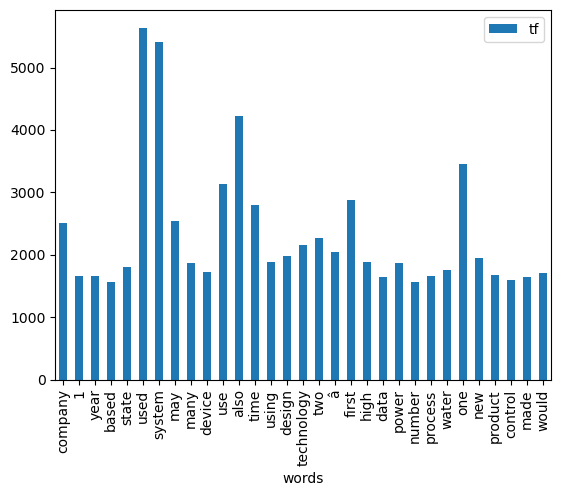

In [25]:
tf[tf["tf"]> 1500].plot.bar(x="words",y="tf")
plt.show()

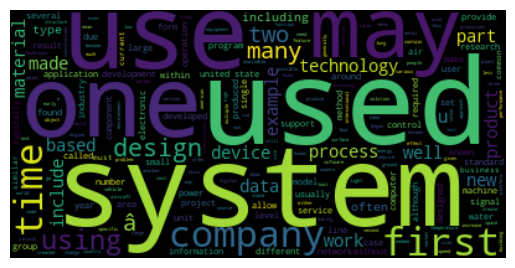

In [26]:
text = " ".join(i for i in df.text)

wordcloud=WordCloud().generate(text)
plt.imshow(wordcloud,interpolation="bilinear")
plt.axis("off")
plt.show()

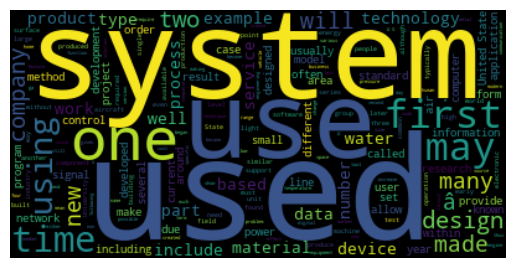

'Anovo Anovo (formerly A Novo) is a computer services company based in Beauvais, France. It was founded in 1987, went public in 1999, and is currently a member of the CAC Small. It won in the category \'Service and Repair\' of the Mobile News Awards four years in a row, from 2007 to 2010. As of November 2017, they have a score of 1.6 out of 10 on the TrustPilot ratings site, with 86% of reviewers giving the company the lowest possible rating. Battery indicator A battery indicator (also known as a battery gauge) is a device which gives information about a battery. This will usually be a visual indication of the battery\'s state of charge. It is particularly important in the case of a battery electric vehicle. Some automobiles are fitted with a battery condition meter to monitor the starter battery. This meter is, essentially, a voltmeter but it may also be marked with coloured zones for easy visualization. Many newer cars no longer offer voltmeters or ammeters; instead, these vehicles t

In [28]:
#Tüm Aşamaları Tek Bir Fonksiyon

df=pd.read_csv("nlp/datasets/wiki_data.csv",index_col=0)
df=df[:2000]

def wiki_preprocess(text, Barplot=False,WordCloud_plot=False):
    """
    Textler üzerinde ön işleme işlemleri yapar.

    Example:
        wiki_preprocess(dataframe[col_name]) 
    """
    text=text.str.lower()
    text=text.str.replace("[^\w\s]"," ",regex=True)
    text=text.str.replace("\n"," ")    
    text=text.str.replace("[\d]"," ")
    
    sw=stopwords.words("English")
    text=text.apply(lambda x: " ".join(x for x in str(x).split() if x not in sw))

    remove=pd.Series(" ".join(df["text"]).split()).value_counts()[-1000:]
    df["text"]=df["text"].apply(lambda x: " ".join(x for x in x.split() if x not in remove ))
    
    if Barplot:
        tf=df["text"].apply(lambda x: pd.value_counts(x.split(" "))).sum(axis=0).reset_index()
        tf.columns=["words","tf"]
        tf.sort_values("tf",ascending=False)
        plt.show()

    if WordCloud_plot:
        text = " ".join(i for i in df.text)
        wordcloud=WordCloud().generate(text)
        plt.imshow(wordcloud,interpolation="bilinear")
        plt.axis("off")
        plt.show()
    
    return text

#wiki_preprocess(df["text"])

wiki_preprocess(df["text"],True,True)
